In [326]:
import os
from datetime import datetime
import numpy as np
import glob
from satpy import Scene
import satpy
import subprocess

import pyresample
from pyresample import geo_filter, geometry, load_area
import shapely.geometry as sgeom

import cartopy.crs as ccrs
import pandas as pd

import PIL

import matplotlib.pyplot as plt

In [193]:
SAT_IMAGERY_PATH = '/storage/data/eumetsat/native/sorted'
TEMP_PATH = '/home/jack/temp'

In [194]:
def get_directory_for_datetime(sat_imagery_path: str, dt: datetime) -> str:
    """
    Args:
        sat_imagery_path:
        dt: the datetime for the requested image.  Will return
            the directory which is within 5 minutes of the requested image.
    Returns:
        Directory string
        
    Raises:
        FileNotFoundError
    """
    hour_path = dt.strftime("%Y/%m/%d/%H")
    hour_path = os.path.join(SAT_IMAGERY_PATH, hour_path)
    
    # Get a list of subdirectories containing minutes
    _, minute_dirs, _ = next(os.walk(hour_path))
    minutes_with_images = np.array(minute_dirs, dtype=int)
    
    # Quantize dt.minute to 5-minute intervals
    minute_lower_bound = (dt.minute // 5) * 5
    minute_upper_bound = minute_lower_bound + 5
    
    # Find matching directory for the minutes
    selection_condition = (
        (minute_lower_bound <= minutes_with_images) & 
        (minutes_with_images < minute_upper_bound))
    idx = np.flatnonzero(selection_condition)
    
    # Sanity check
    if idx.size == 0:
        raise FileNotFoundError(2, 'No minute directory for datetime {} under "{}"'.format(dt, hour_path))
    elif idx.size > 1:
        raise RuntimeError(
            'Found > 1 directories with images for datetime {}.'
            '  Base dir = "{}".  Subdirs found = {}'
            .format(dt, hour_path, minute_dirs))
        
    selected_minute_dir = minutes_with_images[idx[0]]
    selected_minute_dir = '{:02d}'.format(selected_minute_dir)
    selected_minute_dir = os.path.join(hour_path, selected_minute_dir)
    
    return selected_minute_dir

'/storage/data/eumetsat/native/sorted/2019/01/25/13/04'

In [195]:
def get_image_filename_for_datetime(
    sat_imagery_path: str, 
    dt: datetime,
    pattern: str = 'MSG*.nat.bz2'
    ) -> str:
    
    image_path = get_directory_for_datetime(sat_imagery_path, dt)
    files = glob.glob(os.path.join(image_path, pattern))
    error_str = 'file matching "{}" in "{}" for datetime {}.'.format(pattern, image_path, dt)
    if len(files) == 0:
        raise FileNotFoundError(2, 'No ' + error_str)
    if len(files) > 1:
        raise RuntimeError('Found > 1 ' + error_str + '  Expected only one match.')
    image_filename = files[0]
    return image_filename

'/storage/data/eumetsat/native/sorted/2019/01/25/13/04/MSG3-SEVI-MSG15-0100-NA-20190125130416.429000000Z-20190125130435-1354464-5.nat.bz2'

In [196]:
def decompress(full_bzip_filename: str) -> str:
    base_bzip_filename = os.path.basename(full_bzip_filename)
    base_nat_filename = os.path.splitext(base_bzip_filename)[0]
    full_nat_filename = os.path.join(TEMP_PATH, base_nat_filename)
    if not os.path.exists(full_nat_filename):
        with open(full_nat_filename, 'wb') as nat_file_handler:
            process = subprocess.run(
                ['pbzip2', '--decompress', '--keep', '--stdout', full_bzip_filename],
                stdout=nat_file_handler)
        process.check_returncode()
    return full_nat_filename

In [435]:
dt = datetime(year=2019, month=1, day=3, hour=12, minute=0)  # 2019-01-22 10:00 is fairly good for UK
full_bzip_filename = get_image_filename_for_datetime(SAT_IMAGERY_PATH, dt)
full_nat_filename = decompress(full_bzip_filename)
handler = satpy.readers.seviri_l1b_native.NativeMSGFileHandler(full_nat_filename, {}, None)

In [436]:
planned_coverage_hrv = handler.header['15_DATA_HEADER']['ImageDescription']['PlannedCoverageHRV']

In [437]:
east_column_planned = planned_coverage_hrv['LowerEastColumnPlanned']

2717 8284
5567


In [449]:
scene.attrs

{'sensor': {'seviri'},
 'start_time': datetime.datetime(2019, 1, 3, 12, 0, 10, 599799),
 'end_time': datetime.datetime(2019, 1, 3, 12, 5, 10, 661096),
 'blah': 'hi'}

In [564]:
def get_seviri_hrv_area_definition(east_column_planned=2733) -> geometry.AreaDefinition:
    X_OFFSET = 32500 + ((2733 - east_column_planned) * 1000)
    HRV_WIDTH_PIXELS = 5568
    HRV_HEIGHT_PIXELS = 4176
    PROJECTION = {
        'proj': 'geos',
        'lon_0': 9.5,
        'a': 6378169.0,
        'b': 6356583.8,
        # The EUMETSAT docs say "The distance between spacecraft and centre of earth is 42,164 km. The idealized earth
        # is a perfect ellipsoid with an equator radius of 6378.1690 km and a polar radius of 6356.5838 km." 
        # But SayPy uses 35,785 km as the height.  35,785 km seems to work well.
        'h': 35785831.00,
        'units': 'm'}

    seviri = geometry.AreaDefinition(
        area_id='seviri',
        description='SEVIRI RSS HRV',
        proj_id='seviri',   
        projection=PROJECTION,
        width=HRV_WIDTH_PIXELS,
        height=HRV_HEIGHT_PIXELS,
        area_extent=[  # VIS006 extent: -5570248.4773, 1393687.2705, 5567248.0742, 5570248.4773
            -2768872.0236 + X_OFFSET, # left
             1394687.3495, # bottom  (from scene['HRV'].area)
             2799876.1893 + X_OFFSET, # right
             5570248.4773] #5569248.1217] # top  (from scene['HRV'].area)
    )

    return seviri

In [565]:
def get_scene(sat_imagery_path: str, dt: datetime) -> Scene:
    full_bzip_filename = get_image_filename_for_datetime(sat_imagery_path, dt)
    full_nat_filename = decompress(full_bzip_filename)
    scene = Scene(
        filenames=[full_nat_filename],
        reader='seviri_l1b_native')
    
    # HRV images are offset differently on different images, so we need to grab
    # the relevant metadata
    handler = satpy.readers.seviri_l1b_native.NativeMSGFileHandler(full_nat_filename, {}, None)
    planned_coverage_hrv = handler.header['15_DATA_HEADER']['ImageDescription']['PlannedCoverageHRV']
    scene.attrs['HRVLowerEastColumnPlanned'] = planned_coverage_hrv['LowerEastColumnPlanned']
    
    return scene

In [451]:
# dt = datetime(year=2019, month=1, day=1, hour=12, minute=0)  # 2019-01-22 10:00 is fairly good for UK
scene = get_scene(SAT_IMAGERY_PATH, dt)
scene.load(['VIS006', 'HRV'])
hrv = scene['HRV']

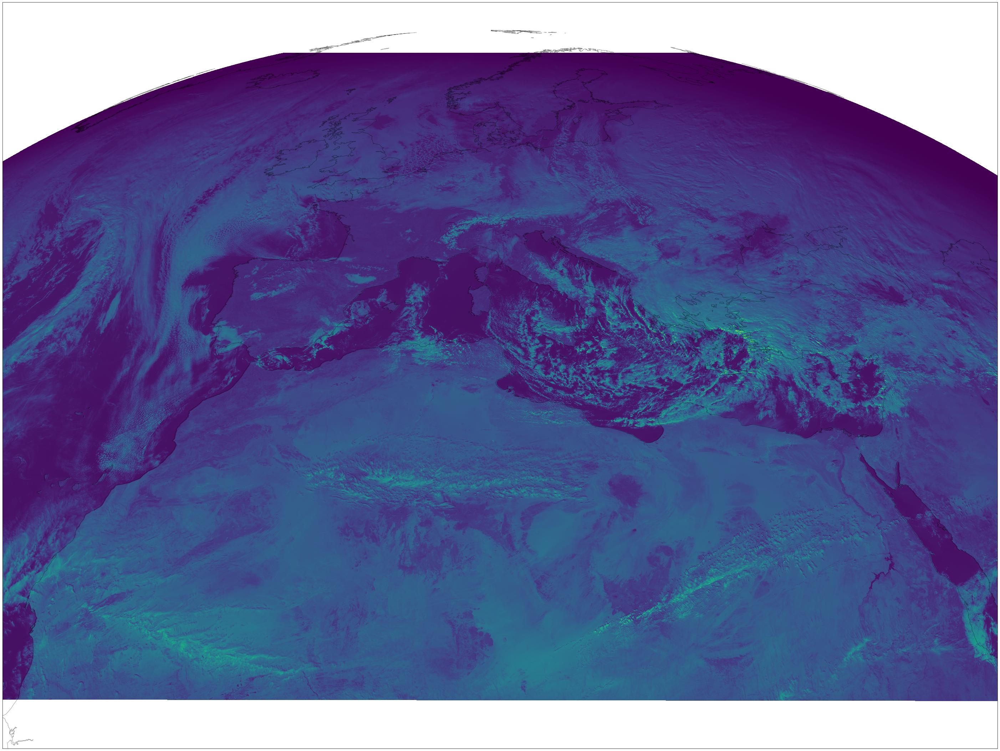

In [452]:
hrv = scene['HRV'].values
crs = seviri.to_cartopy_crs()
fig = plt.figure(figsize=(50, 40))
ax = plt.axes(projection=crs)
ax.coastlines(resolution='10m', alpha=0.4)
ax.imshow(
    hrv,
    extent=crs.bounds,
    origin='upper')

In [474]:
def get_hrv_image(
    sat_imagery_path: str, 
    dt: datetime, 
    target_area_definition: geometry.AreaDefinition) -> np.ndarray:
    """The non-hrv channels it's probably fine to use scene.resample(target_area_definition)."""

    scene = get_scene(sat_imagery_path, dt)
    scene.load(['HRV'])
    hrv = scene['HRV'].values
    seviri = get_seviri_hrv_area_definition(scene.attrs['HRVLowerEastColumnPlanned'])
    seviri_image = pyresample.image.ImageContainerQuick(hrv, seviri)
    resampled = seviri_image.resample(target_area_definition)
    return resampled

## UKV

In [212]:
KM_TO_M = 1000

NORTH = 1223 * KM_TO_M
SOUTH = -185 * KM_TO_M
WEST = -239 * KM_TO_M
EAST = 857 * KM_TO_M

class UKVDomain(ccrs.OSGB):
    """The geographical domain of the UK Met Office UKV model."""
    
    @property
    def x_limits(self):
        return (WEST, EAST)
    
    @property
    def y_limits(self):
        return (SOUTH, NORTH)
    
    @property
    def boundary(self):
        return sgeom.LineString([
            (WEST, SOUTH), 
            (WEST, NORTH), 
            (EAST, NORTH), 
            (EAST, SOUTH), 
            (WEST, SOUTH)])
    
ukv = UKVDomain()
ukv

/home/jack/miniconda3/envs/sat_image_processing/lib/python3.7/site-packages/cartopy/mpl/ticker.py:476: MatplotlibDeprecationWarning: MaxNLocator.set_params got an unexpected parameter: dms
  MaxNLocator.set_params(self, **kwargs)


In [483]:
area_extent = [
        WEST,# - 1500000, # lower_left_x
        SOUTH, # lower_left_y
        EAST,# - 500000,  # upper_right_x
        NORTH,# + 500000] # upper_right_y
]

proj4_params = ukv.proj4_params

ukv_geom = geometry.AreaDefinition(
    area_id='UKV',
    description='Europe (3km, HRV, VTC)',
    proj_id='UKV',
    projection=proj4_params,
    width=700,  # in number of pixels
    height=1000, # in number of pixels
    area_extent=area_extent,
    nprocs=8
)

ukv_geom

Area ID: UKV
Description: Europe (3km, HRV, VTC)
Projection ID: UKV
Projection: {'ellps': 'airy', 'k': '0.9996012717', 'lat_0': '49', 'lon_0': '-2', 'no_defs': 'None', 'proj': 'tmerc', 'type': 'crs', 'units': 'm', 'x_0': '400000', 'y_0': '-100000'}
Number of columns: 700
Number of rows: 1000
Area extent: (-239000, -185000, 857000, 1223000)

In [214]:
ukv_geom.to_cartopy_crs()

/home/jack/miniconda3/envs/sat_image_processing/lib/python3.7/site-packages/pyresample/_cartopy.py:65: UserWarning: Converting EPSG projection to proj4 string, which is a potentially lossy transformation
  warnings.warn('Converting EPSG projection to proj4 string, which is a potentially lossy transformation')


_PROJ4Projection(+ellps=airy +proj=tmerc +lat_0=49.0 +lon_0=-2.0 +k=0.9996012717 +x_0=400000.0 +y_0=-100000.0 +units=m +no_defs=True +no_defs)

## Europe

In [215]:
europe = geometry.AreaDefinition(
    area_id='areaD',
    description='Europe (3km, HRV, VTC)',
    proj_id='areaD',
    projection={  # Proj.4 parameters
     'lat_0': '90.0',
     'lat_ts': '60.00',
     'lon_0': '0.00',
     'ellps': 'WGS84',
     'proj': 'stere'},
    width=500,  # in number of pixels
    height=500, # in number of pixels
    area_extent=[
        -3780000.0, # lower_left_x
        -7644000.0, # lower_left_y
        3900000.0,  # upper_right_x
        -1500000.0], # upper_right_y
    nprocs=8
)

In [216]:
europe

Area ID: areaD
Description: Europe (3km, HRV, VTC)
Projection ID: areaD
Projection: {'ellps': 'WGS84', 'lat_0': '90', 'lat_ts': '60', 'lon_0': '0', 'no_defs': 'None', 'proj': 'stere', 'type': 'crs', 'units': 'm', 'x_0': '0', 'y_0': '0'}
Number of columns: 500
Number of rows: 500
Area extent: (-3780000.0, -7644000.0, 3900000.0, -1500000.0)

In [217]:
europe.to_cartopy_crs()

_PROJ4Projection(+ellps=WGS84 +lat_0=90.0 +lat_ts=60.0 +lon_0=0.0 +no_defs=True +proj=stere +type=crs +units=m +x_0=0.0 +y_0=0.0 +no_defs)

In [218]:
crs = seviri.to_cartopy_crs()
crs

_PROJ4Projection(+ellps=WGS84 +a=6378169.0 +b=6356583.8 +h=35785831.0 +lon_0=9.5 +no_defs=True +proj=geos +type=crs +units=m +x_0=0.0 +y_0=0.0 +no_defs)

In [574]:
%%time
target_area_definition = ukv_geom # europe 
dt = datetime(year=2019, month=1, day=3, hour=14, minute=0)  # 2019-01-17 12:00 is fairly good for UK
resampled = get_hrv_image(SAT_IMAGERY_PATH, dt, target_area_definition)

CPU times: user 913 ms, sys: 179 ms, total: 1.09 s
Wall time: 985 ms


/home/jack/miniconda3/envs/sat_image_processing/lib/python3.7/site-packages/pyresample/_cartopy.py:65: UserWarning: Converting EPSG projection to proj4 string, which is a potentially lossy transformation
  warnings.warn('Converting EPSG projection to proj4 string, which is a potentially lossy transformation')


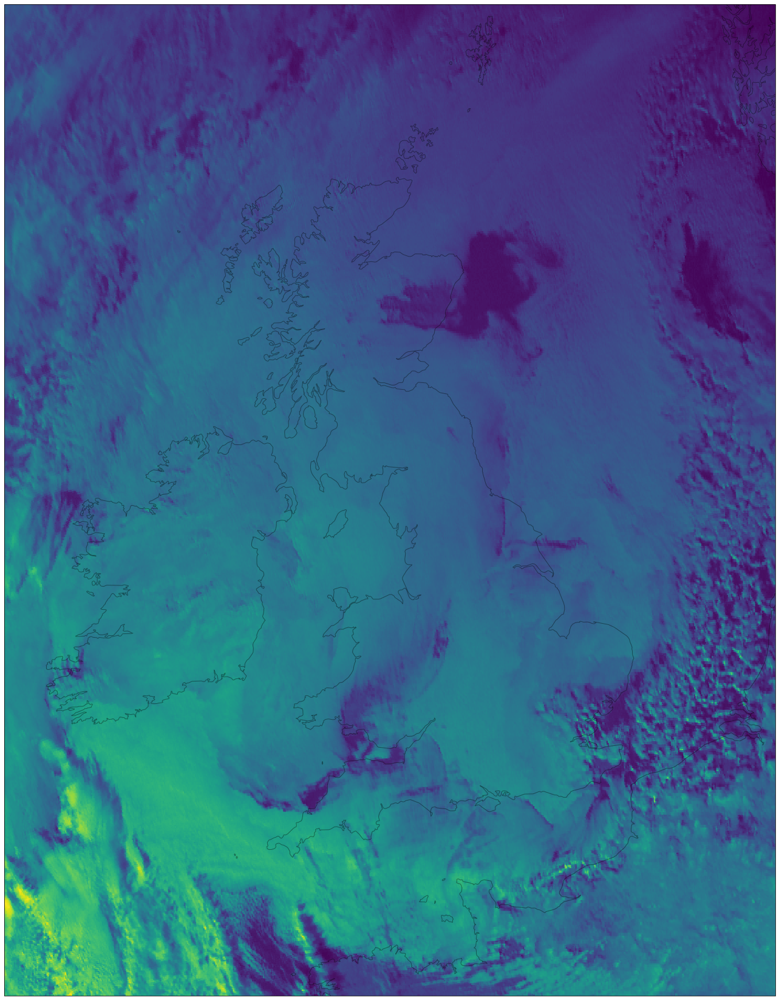

In [575]:
crs = target_area_definition.to_cartopy_crs()
fig = plt.figure(figsize=(30, 30))
ax = plt.axes(projection=crs)
ax.coastlines(resolution='10m', alpha=0.4)
ax.imshow(
    resampled.image_data,
    extent=crs.bounds,
    origin='upper')